# Instacart orders project

In this project we will explore the Instacars orders dataset using new pandas, numpy, plot and datetime methods. 
The goal of this project is gaining actionable insights into consumer behavior and ordering patterns within the Instacars platform. By exploring and analyzing the dataset, the aim is to uncover trends and patterns related to the timing and frequency of grocery orders. These insights can then be used to optimize marketing strategies, improve customer engagement, and enhance overall business operations.
For the project we have 5 datasets:
- Orders dataset that contains info about every order separately (order ID, user ID, number of customers order, when the order has been placed, and when has been placed the previast order.
- Products dataset that contains info about products such as product ID, name of the product and what the aisle and department of each product.
- Departments dataset that contains information about departments and their IDs.
- Aisles dataset that contains info about aisles and their IDs.
- Order products dataset that contains info about every product in every order separately. It tells in which order the product has been added to cart and if this product was reordered.

After every dataset clean and preprocessed we will explore them and will made nesessary conclusions. We will do this using new exploring features and plots and histograms for beutiful visualisation.


In [22]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

### Orders dataset

In [23]:
orders = pd.read_csv('instacart_orders.csv', sep=';')
orders.sample(10)

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
332825,2349850,96641,4,6,16,12.0
303887,2127068,130402,4,2,12,0.0
9033,3340480,85831,11,6,22,7.0
268982,1010636,100091,1,4,14,NaN
444330,1831136,199062,10,0,8,7.0
105267,3352726,83724,10,6,11,27.0
314867,419845,12452,5,5,12,30.0
467857,18908,47606,30,3,10,7.0
104336,3187934,26385,3,0,13,14.0
454088,2850764,198584,55,5,17,2.0


In [24]:
orders.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478967 entries, 0 to 478966
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   order_id                478967 non-null  int64  
 1   user_id                 478967 non-null  int64  
 2   order_number            478967 non-null  int64  
 3   order_dow               478967 non-null  int64  
 4   order_hour_of_day       478967 non-null  int64  
 5   days_since_prior_order  450148 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 21.9 MB


###  Products dataset

In [25]:
products = pd.read_csv('products.csv', sep=';')
products.sample(10)

,product_id,product_name,aisle_id,department_id
3281,3282,Chips Ahoy! Original Chocolate Chip Cookies,61,19
49113,49114,Organic Soups Alphabet Fat Free,69,15
16296,16297,Vitamins- Fiber- Gummy- Box,70,11
11751,11752,Super Moist Vanilla Cake Mix,105,13
32150,32151,Gluten Free Wraps,128,3
38570,38571,Fruit Snacks Banana- Cherry- Peach & Strawberr...,45,19
32128,32129,Mama Sorrenti's Minestrone,63,9
33202,33203,Excellence Non-Drip Crème - 4 Dark Brown,22,11
7300,7301,Diet Cranberry Pomegranate Juice,98,7
2606,2607,Granulated Box Posted 5/7/2014 No Calorie Swee...,17,13


In [26]:
products.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49694 entries, 0 to 49693
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49694 non-null  int64 
 1   product_name   48436 non-null  object
 2   aisle_id       49694 non-null  int64 
 3   department_id  49694 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


### Departments dataset 

In [27]:
departments = pd.read_csv('departments.csv', sep=';')
departments.head(10)

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [28]:
departments.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 468.0+ bytes


### Aisles dataset 

In [29]:
aisles = pd.read_csv('aisles.csv', sep=';')
aisles.head(10)

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
5,6,other
6,7,packaged meat
7,8,bakery desserts
8,9,pasta sauce
9,10,kitchen supplies


In [30]:
aisles.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   aisle_id  134 non-null    int64 
 1   aisle     134 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.2+ KB


### Order products dataset 

In [46]:
order_products = pd.read_csv('order_products.csv', sep=';')
order_products.head(10)


,order_id,product_id,add_to_cart_order,reordered
0,2141543,11440,17.0,0
1,567889,1560,1.0,1
2,2261212,26683,1.0,1
3,491251,8670,35.0,1
4,2571142,1940,5.0,1
5,2456893,21616,4.0,1
6,644579,12341,5.0,1
7,2231852,44925,10.0,1
8,3185766,36259,14.0,1
9,420019,23315,4.0,1


In [47]:
order_products.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4545007 entries, 0 to 4545006
Data columns (total 4 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   order_id           4545007 non-null  int64  
 1   product_id         4545007 non-null  int64  
 2   add_to_cart_order  4544171 non-null  float64
 3   reordered          4545007 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 138.7 MB


After I studied a data I see that I have two "key" datasets that just help us to understand what certain ID mean that is aisle and department datasets.
Other 3 datasets are much more complicated becuse they contain a lot of data with a lot of values that also can be changed in a time so we need pay a lot attention on them in cleaning and preprocessing process.

## Find and remove duplicate values (and describe why you make your choices)

### `orders` data frame

In [15]:
orders

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1515936,183418,11,6,13,30.0
1,1690866,163593,5,5,12,9.0
2,1454967,39980,4,5,19,2.0
3,1768857,82516,56,0,20,10.0
4,3007858,196724,2,4,12,17.0
...,...,...,...,...,...,...
478962,3210681,5617,5,1,14,7.0
478963,3270802,112087,2,3,13,6.0
478964,885349,82944,16,2,11,6.0
478965,216274,4391,3,3,8,8.0


In [16]:
print(orders.duplicated().sum()) # Check for duplicated orders


15


We see that orders DataFrame has 15 duplicates 

In [17]:
orders[orders.duplicated()]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
145574,794638,50898,24,3,2,2.0
223105,2160484,107525,16,3,2,30.0
230807,1918001,188546,14,3,2,16.0
266232,1782114,106752,1,3,2,NaN
273805,1112182,202304,84,3,2,6.0
284038,2845099,31189,11,3,2,7.0
311713,1021560,53767,3,3,2,9.0
321100,408114,68324,4,3,2,18.0
323900,1919531,191501,32,3,2,7.0
345917,2232988,82565,1,3,2,NaN


The problem is that all our duplicates is on 2:00 AM Wednesday so our duplicates are period 

In [18]:
print(orders['order_dow'].unique()) 

[6 5 0 4 3 1 2]


In [19]:
orders[(orders['order_dow'] == 3) & (orders['order_hour_of_day'] == 2)]  # Check for all orders placed Wednesday at 2:00 AM

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
4838,2766110,162084,41,3,2,16.0
5156,2190225,138285,18,3,2,11.0
15506,553049,58599,13,3,2,7.0
18420,382357,120200,19,3,2,11.0
24691,690242,77357,2,3,2,9.0
...,...,...,...,...,...,...
457013,3384021,14881,6,3,2,30.0
458816,910166,164782,18,3,2,4.0
459635,1680532,106435,6,3,2,21.0
468324,222962,54979,59,3,2,3.0


There are 121 orders placed Wednesday at 2:00 AM

In [20]:
orders = orders.drop_duplicates() # Remove duplicate orders


In [21]:
print(orders.duplicated().sum()) # Double check for duplicate rows


0


In [22]:
print(orders['order_id'].duplicated().sum()) # Double check for duplicate order IDs only


0


In [23]:
for column in orders:
    print(orders[orders.duplicated()][column])
    print('-----------')

Series([], Name: order_id, dtype: int64)
-----------
Series([], Name: user_id, dtype: int64)
-----------
Series([], Name: order_number, dtype: int64)
-----------
Series([], Name: order_dow, dtype: int64)
-----------
Series([], Name: order_hour_of_day, dtype: int64)
-----------
Series([], Name: days_since_prior_order, dtype: float64)
-----------


Using this loop we can check every column and make sure that there are no duplicates

Upon examining the dataframe, we identified several duplicates occurring exclusively at 2 o'clock on Wednesdays. While investigating further, we discovered additional orders placed at the same time, not just those already duplicated. Although we intend to notify the data quality team about this issue, for our project's scope, we opted to remove the duplicates. Additionally, we conducted a check for duplicates in order IDs, but none were found.

### `products` data frame

In [24]:
products

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13
...,...,...,...,...
49689,49690,HIGH PERFORMANCE ENERGY DRINK,64,7
49690,49691,ORIGINAL PANCAKE & WAFFLE MIX,130,14
49691,49692,ORGANIC INSTANT OATMEAL LIGHT MAPLE BROWN SUGAR,130,14
49692,49693,SPRING WATER BODY WASH,127,11


In [25]:
# Check for fully duplicate rows
print(products.duplicated().sum()) 


0


In [26]:
# Check for just duplicate product IDs
print(products['product_id'].duplicated().sum()) 


0


In [27]:
# Check for just duplicate product names (convert names to lowercase to compare better)

products['product_name'] = products['product_name'].str.lower()

print(products.duplicated(subset=['product_name']).sum()) 


1361


We see that we have 1361 duplicates in product_name column. But the products can have the same name and it's okay if they don't have the same product ID. Let's check if we have the same products with the same name and product ID 

In [28]:
products[['product_id','product_name']].duplicated().sum()

0

No, we don't have the same products.

In [29]:
# Check for duplicate product names that aren't missing
products[products.duplicated(subset=['product_name'])&(products.product_name.notna())]  

,product_id,product_name,aisle_id,department_id
2058,2059,biotin 1000 mcg,47,11
5455,5456,green tea with ginseng and honey,96,20
5558,5559,cream of mushroom soup,69,15
7558,7559,cinnamon rolls with icing,105,13
9037,9038,american cheese slices,21,16
...,...,...,...,...
49689,49690,high performance energy drink,64,7
49690,49691,original pancake & waffle mix,130,14
49691,49692,organic instant oatmeal light maple brown sugar,130,14
49692,49693,spring water body wash,127,11


Yes, we checked the duplicates by product_name column and found 104 duplicates. But because of that fact that they actually are not the same products beacuse they have different ID I decide that it's not necessary to drop any duplicate. They can be the same products from same manufacturer with the same name but with slight difference and thats reason for giving the products the same name but not the same ID. 

### `departments` data frame

In [30]:
departments

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In this df we have only 21 rows so it's not difficult to understand that there are no missing values or duplicates just by looking at whole dataframe in a second.

### `aisles` data frame

In [31]:
aisles

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
...,...,...
129,130,hot cereal pancake mixes
130,131,dry pasta
131,132,beauty
132,133,muscles joints pain relief


In [32]:
aisles.duplicated().sum()

0

In [33]:
aisles.isna().sum()

aisle_id    0
aisle       0
dtype: int64

Clear and simple data frame without duplicates and missing values 

### `order_products` data frame

In [34]:
order_products

,order_id,product_id,add_to_cart_order,reordered
0,2141543,11440,17.0,0
1,567889,1560,1.0,1
2,2261212,26683,1.0,1
3,491251,8670,35.0,1
4,2571142,1940,5.0,1
...,...,...,...,...
4545002,577211,15290,12.0,1
4545003,1219554,21914,9.0,0
4545004,692640,47766,4.0,1
4545005,319435,691,8.0,1


In [35]:
order_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4545007 entries, 0 to 4545006
Data columns (total 4 columns):
 #   Column             Dtype  
---  ------             -----  
 0   order_id           int64  
 1   product_id         int64  
 2   add_to_cart_order  float64
 3   reordered          int64  
dtypes: float64(1), int64(3)
memory usage: 138.7 MB


In [36]:
order_products.duplicated().sum() # Check for fullly duplicate rows

0

In [37]:
order_products[['order_id', 'product_id']].duplicated().sum() # Double check for any other tricky duplicates

0

order_products data frame contains a lot of duplicates of order_id and product_id because every order can contain a quantity of products and every product can be ordered in many orders. Due to this we should check duplicates by order_id and product_id columns together.

## Find and remove missing values


### `products` data frame

In [38]:
products

,product_id,product_name,aisle_id,department_id
0,1,chocolate sandwich cookies,61,19
1,2,all-seasons salt,104,13
2,3,robust golden unsweetened oolong tea,94,7
3,4,smart ones classic favorites mini rigatoni wit...,38,1
4,5,green chile anytime sauce,5,13
...,...,...,...,...
49689,49690,high performance energy drink,64,7
49690,49691,original pancake & waffle mix,130,14
49691,49692,organic instant oatmeal light maple brown sugar,130,14
49692,49693,spring water body wash,127,11


In [39]:
products.isna().sum()

product_id          0
product_name     1258
aisle_id            0
department_id       0
dtype: int64

In [40]:
# Are all of the missing product names associated with aisle ID 100?
products[(products['product_name'].isna()) & (~products['aisle_id'] == 100)]

,product_id,product_name,aisle_id,department_id


There are missing product names only with aisle ID 100 

In [41]:
# Are all of the missing product names associated with department ID 21?
products[(products['product_name'].isna()) & (~products['department_id'] == 21)]


,product_id,product_name,aisle_id,department_id


There are only missing products only with aisle ID 100 and department ID 21 

In [42]:
# What is this aisle and department?
display(aisles[aisles['aisle_id'] == 100])
display(departments[departments['department_id'] == 21])

,aisle_id,aisle
99,100,missing


,department_id,department
20,21,missing


That's the aisle and department IDs that belongs to missing values.

In [43]:
# Fill missing product names with 'Unknown'
products['product_name'] = products['product_name'].where(products['product_name'].notna(), 'unknown')


In [44]:
products.isna().sum()

product_id       0
product_name     0
aisle_id         0
department_id    0
dtype: int64

### `orders` data frame

In [45]:
orders

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1515936,183418,11,6,13,30.0
1,1690866,163593,5,5,12,9.0
2,1454967,39980,4,5,19,2.0
3,1768857,82516,56,0,20,10.0
4,3007858,196724,2,4,12,17.0
...,...,...,...,...,...,...
478962,3210681,5617,5,1,14,7.0
478963,3270802,112087,2,3,13,6.0
478964,885349,82944,16,2,11,6.0
478965,216274,4391,3,3,8,8.0


In [46]:
orders.isna().sum()

order_id                      0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    28817
dtype: int64

In [47]:
orders[orders['days_since_prior_order'].isna()]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
28,133707,182261,1,3,10,NaN
96,787445,25685,1,6,18,NaN
100,294410,111449,1,0,19,NaN
103,2869915,123958,1,4,16,NaN
104,2521921,42286,1,3,18,NaN
...,...,...,...,...,...,...
478895,2589657,205028,1,0,16,NaN
478896,2222353,141211,1,2,13,NaN
478922,2272807,204154,1,1,15,NaN
478926,2499542,68810,1,4,19,NaN


In [48]:
# Are there any missing values where it's not a customer's first order?
orders[(orders['order_number'] > 1) & (orders['order_number'].isna())]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order


There are no missing values in 'order_number' column if custumer has more than one order

In [51]:
warnings.filterwarnings(action='ignore')
orders['days_since_prior_order'] = orders['days_since_prior_order'].where(orders['days_since_prior_order'].notna(), 999999)

We see that there are missing values only in 'days_since_prior_order' column. All this orders with missing values in 'days_since_prior_order' column are first custumer's order for this reason there is no previous order so we can replace missing value with 999999

In [52]:
orders['days_since_prior_order'] = orders['days_since_prior_order'].astype('int')

In [53]:
orders.isna().sum()

order_id                  0
user_id                   0
order_number              0
order_dow                 0
order_hour_of_day         0
days_since_prior_order    0
dtype: int64

In [54]:
orders

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1515936,183418,11,6,13,30
1,1690866,163593,5,5,12,9
2,1454967,39980,4,5,19,2
3,1768857,82516,56,0,20,10
4,3007858,196724,2,4,12,17
...,...,...,...,...,...,...
478962,3210681,5617,5,1,14,7
478963,3270802,112087,2,3,13,6
478964,885349,82944,16,2,11,6
478965,216274,4391,3,3,8,8


### `order_products` data frame

In [55]:
order_products

,order_id,product_id,add_to_cart_order,reordered
0,2141543,11440,17.0,0
1,567889,1560,1.0,1
2,2261212,26683,1.0,1
3,491251,8670,35.0,1
4,2571142,1940,5.0,1
...,...,...,...,...
4545002,577211,15290,12.0,1
4545003,1219554,21914,9.0,0
4545004,692640,47766,4.0,1
4545005,319435,691,8.0,1


In [56]:
order_products.isna().sum()

order_id               0
product_id             0
add_to_cart_order    836
reordered              0
dtype: int64

In [57]:
order_products[order_products['add_to_cart_order'].isna()]

,order_id,product_id,add_to_cart_order,reordered
737,2449164,5068,NaN,0
9926,1968313,43867,NaN,0
14394,2926893,11688,NaN,0
16418,1717990,4142,NaN,0
30114,1959075,42828,NaN,1
...,...,...,...,...
4505662,1800005,7411,NaN,0
4511400,1633337,260,NaN,0
4517562,404157,9517,NaN,0
4534112,1673227,17835,NaN,0


In [58]:
print("Min in this column is", order_products['add_to_cart_order'].min()) # What are the min and max values in this column?
print()
print("Max in this column is",order_products['add_to_cart_order'].max())


Min in this column is 1.0

Max in this column is 64.0


In [59]:
# Save all order IDs with at least one missing value in 'add_to_cart_order'
orders_missing = list(order_products[order_products.add_to_cart_order.isna()]['order_id'].unique())
orders_missing

[2449164,
 1968313,
 2926893,
 1717990,
 1959075,
 844733,
 61355,
 936852,
 264710,
 1564093,
 129627,
 293169,
 2849370,
 1386261,
 3308010,
 903110,
 2136777,
 3347453,
 1888628,
 165801,
 2094761,
 1038146,
 2997021,
 813364,
 2256933,
 171934,
 2409109,
 1730767,
 1169835,
 733526,
 404157,
 3125735,
 747668,
 1800005,
 1961723,
 871281,
 388234,
 1648217,
 1477139,
 102236,
 1021563,
 1832957,
 2721963,
 678116,
 1220886,
 1673227,
 2999801,
 1633337,
 2470674,
 2625444,
 1677118,
 2479011,
 3383594,
 1183255,
 1713430,
 2652650,
 1598369,
 1916118,
 854647,
 1302315,
 888470,
 180546,
 2621907,
 1308785,
 2729254,
 9310,
 2170451,
 2979697,
 1625713,
 1529171]

In [60]:
# Do all orders with missing values have more than 64 products?
order_products[order_products.order_id.isin(orders_missing)]

,order_id,product_id,add_to_cart_order,reordered
267,2094761,31469,57.0,1
737,2449164,5068,NaN,0
1742,2997021,4920,37.0,0
3463,871281,40063,61.0,1
3535,171934,36397,7.0,0
...,...,...,...,...
4543519,2621907,32018,28.0,1
4544672,102236,34688,49.0,0
4544708,2256933,41544,21.0,0
4544771,180546,12741,46.0,1


In [61]:
order_products[order_products.order_id.isin(orders_missing)].groupby(['order_id'])['product_id'].nunique()

order_id
9310        65
61355      127
102236      95
129627      69
165801      70
          ... 
2999801     70
3125735     86
3308010    115
3347453     71
3383594     69
Name: product_id, Length: 70, dtype: int64

In [62]:
(order_products[order_products.order_id.isin(orders_missing)].groupby(['order_id'])['product_id'].nunique()>64).value_counts()

product_id
True    70
Name: count, dtype: int64

There are 70 values that have more than 64 products

All the missing values is in the orders that have more than 64 products in the cart. It may mean that after the product number 64 the products that a costumer adds to cart stop be counted by system. I think thats a problem with the process of storing the data so we just replace the missing values in this case by 999 as requered in a task.

In [63]:
# Replace missing values with 999 and convert column to integer type
order_products['add_to_cart_order'] = order_products['add_to_cart_order'].where(order_products['add_to_cart_order'].notna(), 999)


In [64]:
order_products['add_to_cart_order'] = order_products['add_to_cart_order'].astype('int')

In [65]:
order_products.isna().sum()

order_id             0
product_id           0
add_to_cart_order    0
reordered            0
dtype: int64

In [66]:
order_products[order_products['add_to_cart_order'] == 999]

,order_id,product_id,add_to_cart_order,reordered
737,2449164,5068,999,0
9926,1968313,43867,999,0
14394,2926893,11688,999,0
16418,1717990,4142,999,0
30114,1959075,42828,999,1
...,...,...,...,...
4505662,1800005,7411,999,0
4511400,1633337,260,999,0
4517562,404157,9517,999,0
4534112,1673227,17835,999,0


# [A] 

### [A1] Verify that the `'order_hour_of_day'` and `'order_dow'` values in the `orders` tables are sensible (i.e. `'order_hour_of_day'` ranges from 0 to 23 and `'order_dow'` ranges from 0 to 6)

In [67]:
orders

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1515936,183418,11,6,13,30
1,1690866,163593,5,5,12,9
2,1454967,39980,4,5,19,2
3,1768857,82516,56,0,20,10
4,3007858,196724,2,4,12,17
...,...,...,...,...,...,...
478962,3210681,5617,5,1,14,7
478963,3270802,112087,2,3,13,6
478964,885349,82944,16,2,11,6
478965,216274,4391,3,3,8,8


In [68]:
print(sorted(orders['order_hour_of_day'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


orders['order_hour_of_day'] do really ranges from 0 to 23

In [69]:
print(sorted(orders['order_dow'].unique()))

[0, 1, 2, 3, 4, 5, 6]


orders['order_dow'] do really ranges from 0 to 6

### [A2] What time of day do people shop for groceries?

In [70]:
time_orders = orders.groupby('order_hour_of_day')['order_id'].count().sort_values(ascending=False).reset_index()
time_orders

,order_hour_of_day,order_id
0,10,40578
1,11,40032
2,15,39789
3,14,39631
4,13,39007
5,16,38112
6,12,38034
7,9,35896
8,17,31930
9,18,25510


In [71]:
time_orders_bar = px.bar(time_orders, 
                   title='Time of Day People Do More Groceries',
                   x='order_hour_of_day',
                   y='order_id'  
                  )

time_orders_bar.update_layout(xaxis_title='Time of Day',
                  yaxis_title='Count of Orders')

time_orders_bar.show()

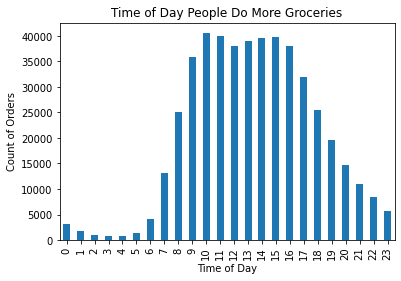

In [67]:
#ADDED BY REVIEWER

orders.groupby('order_hour_of_day')['order_id'].count().plot(x='order_hour_of_day',
           kind='bar',
           title='Time of Day People Do More Groceries',
           xlabel='Time of Day',
           ylabel='Count of Orders')

plt.show()

The majority of people do shop for groceries at 10 AM

### [A3] What day of the week do people shop for groceries?

In [72]:
orders_grouped = orders.groupby('order_dow')['order_id'].count().sort_values(ascending=False).reset_index()
orders_grouped

,order_dow,order_id
0,0,84090
1,1,82185
2,2,65833
3,5,63488
4,6,62649
5,3,60897
6,4,59810


In [73]:
orders_grouped_fig = px.bar(orders_grouped, 
                   title='Day of Week People Do More Groceries',
                   x='order_dow',
                   y='order_id'  
                  )

orders_grouped_fig.update_layout(xaxis_title='Day of Week',
                  yaxis_title='Count of Orders')

orders_grouped_fig.show()

The majority of people do shop for groceries in Sunday

<div class="alert alert-success"; style="border-left: 7px solid green">
<b>✅ Reviewer's comment, v. 1</b> 
    
Good.

### [A4] How long do people wait until placing another order?

As we remember 999999 in a column 'days_since_prior_order' mean that it is a first costumer's order so these values aren't relevant for us in this case so we took not the first orders and saved them in prior_notna value.

In [74]:
prior_notna = orders[orders['days_since_prior_order'] != 999999]

In [75]:
prior_notna.sample(10)

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
230907,2052840,65615,2,6,10,15
29556,2322697,77103,21,4,10,14
472271,2041910,45757,17,5,15,2
141625,920607,50229,2,1,12,17
327521,2464373,171243,17,5,12,10
460730,3367959,152360,40,6,12,8
435890,3272231,92807,6,4,13,30
296678,747951,1246,42,2,13,2
422973,466494,1327,18,4,16,8
110570,592186,139631,35,4,15,1


In [76]:
prior_notna['days_since_prior_order'].describe()

count    450135.000000
mean         11.101814
std           9.190004
min           0.000000
25%           4.000000
50%           7.000000
75%          15.000000
max          30.000000
Name: days_since_prior_order, dtype: float64

In [77]:
prior_notna_bar = px.bar(prior_notna,
           x='days_since_prior_order',
           y='user_id',
           title='Frequency of Orders')

prior_notna_bar.update_layout(xaxis_title='Day of Week',
                  yaxis_title='Count of Orders') 
plt.show()

<Axes: xlabel='days_since_prior_order', ylabel='Count'>

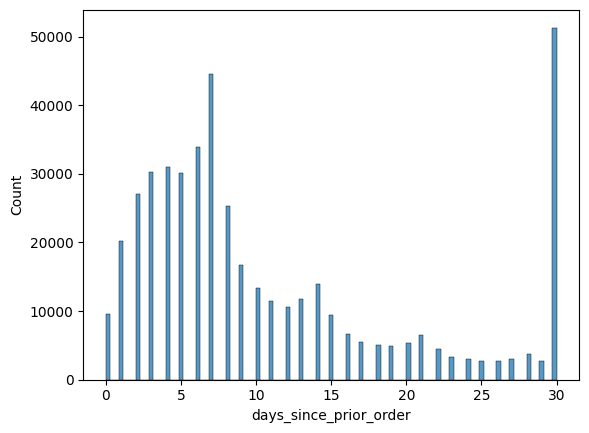

In [78]:
sns.histplot(data = prior_notna, x = 'days_since_prior_order')

Due to mean of column there are 11 days approximately between orders but if we will look at the histogram it tells that the majority of costumers place an order once every 30 days or less so I assume that in average costumer place an order less then once in a month. 

# [B] 

### [B1] Is there a difference in `'order_hour_of_day'` distributions on Wednesdays and Saturdays? Plot the histograms for both days and describe the differences that you see.

In [79]:
orders.sample(10)

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
511,2556731,87143,7,6,10,29
163330,1294691,175063,37,3,16,7
27830,70181,177645,1,4,13,999999
402168,2056376,45295,12,2,14,9
314454,32948,77256,18,2,9,11
222713,2072042,199796,24,4,20,16
322776,847980,12772,61,2,17,3
84662,1802504,35864,29,5,16,8
453530,2601686,59378,12,1,9,10
44151,3308301,175434,15,5,19,11


In [80]:
sat_wed = orders[orders.order_dow.isin([3,6])]

In [81]:
fig = px.histogram(sat_wed, 
                   title='Order Distribution on Wednesdays and Saturdays',
                   x='order_hour_of_day',
                   color='order_dow',
                   barmode='group',  
                   barnorm=None  
                  )

fig.update_layout(xaxis_title='Order Hour of Day',
                  yaxis_title='Count of Orders')

fig.show()

Due to the histogram the Distribution in Wednesday and Saturday absolutely the same.

### [B2] What's the distribution for the number of orders per customer?

In [82]:
ord_per_cust = orders.groupby(['user_id'])['order_id'].nunique().reset_index()
ord_per_cust

,user_id,order_id
0,2,2
1,4,2
2,5,1
3,6,2
4,7,2
...,...,...
157432,206203,1
157433,206206,7
157434,206207,5
157435,206208,9


In [83]:
ord_per_cust_fig = px.histogram(ord_per_cust, title='Distribution for The Number of Orders Per Customer',
                   x='order_id',
                   labels={'x': 'Count of Orders', 'y': 'Count of Custumers'}
                   )

ord_per_cust_fig.show()

The histogram illustrates that a majority of individuals tend to place fewer orders, with a decreasing trend observed as the number of orders per customer increases. In other words, the distribution is skewed to the right, indicating that the majority of customers have a relatively low number of orders, while fewer customers exhibit higher order frequencies.

### [B3] What are the top 20 popular products (display their id and name)?

In [84]:
order_products

,order_id,product_id,add_to_cart_order,reordered
0,2141543,11440,17,0
1,567889,1560,1,1
2,2261212,26683,1,1
3,491251,8670,35,1
4,2571142,1940,5,1
...,...,...,...,...
4545002,577211,15290,12,1
4545003,1219554,21914,9,0
4545004,692640,47766,4,1
4545005,319435,691,8,1


In [85]:
pop_prod = order_products.groupby('product_id')['order_id'].nunique().reset_index()
pop_prod_name = pop_prod.merge(products, on='product_id', how='inner')
pop_prod_sorted = pop_prod_name.sort_values(by='order_id', ascending=False)
pop_prod_sorted[['product_id', 'order_id', 'product_name']].head(20).reset_index()

,index,product_id,order_id,product_name
0,22808,24852,66050,banana
1,12025,13176,53297,bag of organic bananas
2,19370,21137,37039,organic strawberries
3,20077,21903,33971,organic baby spinach
4,43271,47209,29773,organic hass avocado
5,43788,47766,24689,organic avocado
6,43663,47626,21495,large lemon
7,15364,16797,20018,strawberries
8,24047,26209,19690,limes
9,25556,27845,19600,organic whole milk


The analysis indicates that fruits and vegetables emerge as the most favored products among consumers. This finding suggests a strong preference for fresh and healthy food items, potentially reflecting a growing trend towards wellness and nutrition-conscious lifestyles among consumers

# [C] 

### [C1] How many items do people typically buy in one order? What does the distribution look like?

In [86]:
order_products.sample(10)

,order_id,product_id,add_to_cart_order,reordered
1779578,1969297,5684,13,1
3748143,1389624,9080,7,1
3450900,3152388,29373,1,1
2100679,3232003,8048,2,1
3644213,1440044,13431,10,0
3256939,1954705,23909,2,1
1477479,398182,43928,11,0
2266450,1826387,4799,7,1
804737,1686940,40516,2,1
1465177,1811098,24852,3,1


In [87]:
avg_items = order_products.groupby(['order_id'])['product_id'].nunique().reset_index()
avg_items['product_id'].describe()

count    450046.000000
mean         10.098983
std           7.540206
min           1.000000
25%           5.000000
50%           8.000000
75%          14.000000
max         127.000000
Name: product_id, dtype: float64

In [88]:
avg_items_hist = px.histogram(avg_items, title='Average Amount of Products in a Cart',
                   x='product_id',
                   histfunc='avg'
                   )

avg_items_hist.show()

The histogram reveals that the average number of products per order is approximately 5, with a substantial portion of orders, totaling 32 thousand, consisting of precisely 5 products.

### [C2] What are the top 20 items that are reordered most frequently (display their names and product IDs)?

In [89]:
order_products.sample(10)

,order_id,product_id,add_to_cart_order,reordered
4036261,1107458,31224,11,1
3975424,1352138,196,1,1
4078079,3279203,44987,1,0
952397,486589,25265,20,1
503873,1314220,46654,26,1
1004908,3348306,311,10,1
3730359,754308,24964,7,1
2579105,2609895,29012,3,1
504478,581167,30529,16,0
404750,2489461,13176,3,1


In [90]:
reordered_prod = order_products.groupby('product_id')['reordered'].sum().reset_index()
reordered_prod

,product_id,reordered
0,1,158
1,2,0
2,3,31
3,4,25
4,7,1
...,...,...
45568,49690,4
45569,49691,31
45570,49692,5
45571,49693,11


In [91]:
reordered_name = reordered_prod.merge(products, on='product_id', how='left')
reordered_name_sorted = reordered_name.sort_values(by='reordered', ascending=False)
reordered_name_sorted.head(20)

,product_id,reordered,product_name,aisle_id,department_id
22808,24852,55763,banana,24,4
12025,13176,44450,bag of organic bananas,24,4
19370,21137,28639,organic strawberries,24,4
20077,21903,26233,organic baby spinach,123,4
43271,47209,23629,organic hass avocado,24,4
43788,47766,18743,organic avocado,24,4
25556,27845,16251,organic whole milk,84,16
43663,47626,15044,large lemon,24,4
25666,27966,14748,organic raspberries,123,4
15364,16797,13945,strawberries,24,4


The data analysis unveiled a clear trend: fruits and vegetables reign supreme as the most reordered products. This discovery highlights the enduring popularity and frequent repurchasing of these essential and nutritious items, reflecting their integral role in consumer choices and shopping habits.

# Conclusion

In our project exploring the Instacars orders dataset, we leveraged advanced functionalities of pandas, numpy, plot, and datetime libraries to conduct comprehensive analysis. The dataset encompassed vital information such as order IDs, product IDs, customer IDs, timestamps, and product details, necessitating thorough cleaning and preprocessing across multiple datasets.

Through meticulous analysis and visualization techniques, we unearthed significant insights that can profoundly impact decision-making. Notably, our findings revealed that 10 am emerged as the peak time for grocery shopping, with Sunday emerging as the preferred day for such purchases. Additionally, we discovered that customers tend to place orders less frequently than once a month.

Furthermore, our exploration uncovered that fruits and vegetables are the most popular products, underscoring their enduring appeal among consumers. Additionally, we determined that the average number of products in one order is 5, shedding light on typical purchase behaviors.

In summary, the insights gleaned from our project provide valuable guidance for stakeholders, offering actionable strategies to optimize business operations, enhance customer satisfaction, and drive growth in the competitive market landscape.